In [1]:
%load_ext autoreload
%autoreload 2
# imports
import logging
import sys, os

sys.path.insert(0, os.path.abspath('..'))


import time
from tf_pose import common
import cv2
import numpy as np
from tf_pose.estimator import TfPoseEstimator, BodyPart
from tf_pose.networks import get_graph_path, model_wh
from tf_pose.common import CocoPart
import matplotlib.pyplot as plt
import asyncio
import datetime
import random
import glob
from tqdm.notebook import tqdm
from PIL import Image


import tensorflow as tf
from deepexplain.tf.v1_x import DeepExplain

os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"
logging.getLogger("tensorflow").setLevel(logging.CRITICAL)
logging.getLogger('TfPoseEstimatorRun').setLevel(logging.ERROR)
logging.getLogger('DeepExplain').setLevel(logging.ERROR)
logging.getLogger('TfPoseEstimator').setLevel(logging.ERROR)

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.


Using tf version = 1.15.0


In [3]:
# params 432, 368
w, h = 432, 368
model = 'cmu'
resize_out_ratio = 2.0
e = TfPoseEstimator(get_graph_path(model), target_size=(w, h), trt_bool=False)
image_path = './data/images/highFrequencyData/*.jpg'
test_data = [f for f in glob.glob(image_path)]
# image = common.read_imgfile(image_path, w, h)

def return_uncertain_part(humans):
    part = None
    cur_min = 1.0
    if len(humans) == 0:
        return BodyPart(0, CocoPart.RShoulder.value, 0, 0, 0.0)
    for body_part in humans[0].body_parts.keys():
        if humans[0].body_parts[body_part].score < cur_min:
            part = humans[0].body_parts[body_part]
            cur_min =  humans[0].body_parts[body_part].score
    return part

In [4]:
results = []
# compute attribution only for 99%
quantile = 0.995

for image_path in tqdm(test_data):
    current_stats = {}
    # read file
    current_stats["image"] = common.read_imgfile(image_path, w, h)
    # compute humans and draw them onto the image
    humans = e.inference(current_stats["image"], resize_to_default=(w > 0 and h > 0), upsample_size=resize_out_ratio)
    current_stats["image_result"] = TfPoseEstimator.draw_humans(current_stats["image"], humans, imgcopy=True)
    # compute the worst attribution part
    current_stats["part"] = return_uncertain_part(humans)
    
    # get the resulting confidence map
    current_stats["heatmap"] = e.heatMat[:, :, current_stats["part"].part_idx]
    
    # compute a mask
    quant = np.quantile(current_stats["heatmap"], quantile)
    current_stats["mask"] = current_stats["heatmap"] > quant
    current_stats["mask"] = Image.fromarray(np.uint8(current_stats["mask"]*255))
    current_stats["mask"] = np.array(current_stats["mask"].resize((54, 46),Image.ANTIALIAS))
    
    # use peaks as the mask
#     peak = e.peaks[:, :, current_stats["part"].part_idx]
#     mask  = e.peaks[:, :, current_stats["part"].part_idx] >= np.max(e.peaks[:, :, current_stats["part"].part_idx])
#     peak[mask] = 1.0
#     peak = Image.fromarray(peak)
#     current_stats["mask"] = np.array(peak.resize((54, 46)))
    
    # get the current session
    sess = e.persistent_sess

    # Since we will explain it, the model has to be wrapped in a DeepExplain context
    with DeepExplain(session=sess, graph=e.graph) as de:
        
        input_tensor = e.tensor_image
        output_tensor = e.tensor_heatMat[:, :, :, current_stats["part"].part_idx]
        xs = tf.expand_dims(current_stats["image"], 0).eval(session=sess)
        xs = xs.astype('float64')
       
        Y_shape=[None] + [1, 46, 54] # size of heatmaps
        
        ys = np.expand_dims(np.expand_dims(current_stats["mask"], axis=0), axis=0)
        
        baseline = np.zeros(list(xs.shape)[1:]) # baseline to compare against
        current_stats['Saliency maps'] = de.explain('saliency', T=output_tensor, X=input_tensor, xs=xs, ys=ys, Y_shape=Y_shape)
        current_stats['Gradient * Input'] = de.explain('grad*input', T=output_tensor, X=input_tensor, xs=xs, ys=ys, Y_shape=Y_shape)
    
    results.append(current_stats)

/home/ax/master/2019_02/masterThesis/DeepExplain/deepexplain/tf/v1_x/main.py:94: UserWarning: DeepExplain detected you are trying to use an attribution method that requires gradient override but the original gradient was used instead. You might have forgot to (re)create your graph within the DeepExlain context. Results are not reliable!
  warnings.warn('DeepExplain detected you are trying to use an attribution method that requires '


/home/ax/miniconda3/envs/masterThesis/lib/python3.6/site-packages/skimage/transform/_warps.py:23: UserWarning: The default multichannel argument (None) is deprecated.  Please specify either True or False explicitly.  multichannel will default to False starting with release 0.16.
  warn('The default multichannel argument (None) is deprecated.  Please '


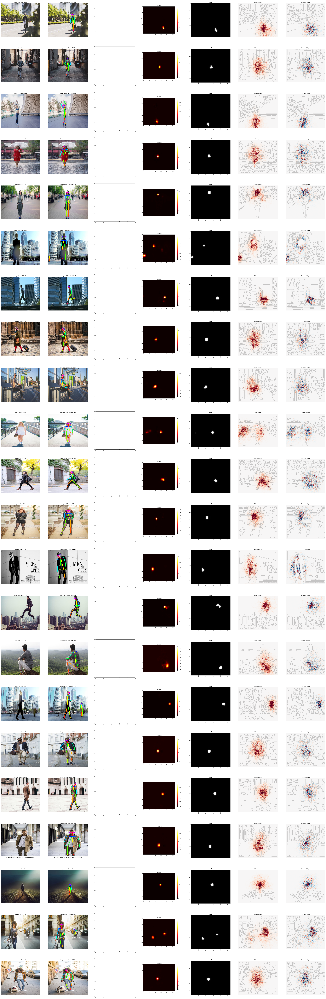

In [5]:
# Plot attributions
from utils import plot, plt
%matplotlib inline

n_cols = int(len(results[0])) 
n_rows = int(len(results)) 
fig_scale = 3
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(3*n_cols*fig_scale, 3*n_rows*fig_scale))

for i, result in enumerate(results):
    ax = axes.flatten()[i*n_cols]
    ax.imshow(result['image'])
    ax.set_title('Original')
    ax.axis('off')
    for j, (key, value) in enumerate(result.items()):
        axj = axes.flatten()[i*n_cols + j]
        if key == 'image' or key == 'image_result':
            axj.imshow(cv2.cvtColor(value, cv2.COLOR_BGR2RGB))
            axj.set_title(f'{key} {result["part"].get_part_name()}')
            axj.axis('off')
        elif key == 'mask':
            axj.imshow(cv2.cvtColor(value, cv2.COLOR_BGR2RGB))
            axj.set_title(key)
        elif key == 'heatmap':
            heat_image = axj.imshow(value, cmap=plt.cm.hot, alpha=1.0)
            axj.set_title(key)
            fig.colorbar(heat_image, ax=axj, shrink=0.63)
        elif key == 'humans' or key == 'part':
            continue
        else:
            xi = (result['image'] - np.min(result['image'])).astype('float64')
            xi /= np.max(xi)
            plot(value[0], xi = xi, axis=axj, dilation=.5, percentile=99, alpha=.2).set_title(key)